## Description
Images are everywhere! We live in a time where images contain lots of information, which is sometimes difficult to obtain. This is why image pre-processing has become a highly valuable skill, applicable in many use cases. In this course, you will learn to process, transform, and manipulate images at your will, even when they come in thousands. You will also learn to restore damaged images, perform noise reduction, smart-resize images, count the number of dots on a dice, apply facial detection, and much more, using scikit-image. After completing this course, you will be able to apply your knowledge to different domains such as machine learning and artificial intelligence, machine and robotic vision, space and medical image analysis, retailing, and many more. Take the step and dive into the wonderful world that is computer vision!

---
## 1.Introducing Image Processing and scikit-image
Jump into digital image structures and learn to process them! Extract data, transform and analyze images using NumPy and Scikit-image. With just a few lines of code, you will convert RGB images to grayscale, get data from them, obtain histograms containing very useful information, and separate objects from the background!


## 1.1 Make images come alive with scikit-image
Image processing is a method to perform operations on images, in order to:
- enhance them
- extract useful information
- analyze it and make decisions

Image processing is a subset of computer vision

Applications:
- analysis of medical images
- artificial intelligence
- image restoration
- surveillance and many more

Ppurpose of image processing:
- Visualization: observe objects that are not visible
- Image sharpening and restoration: to create a better image
- Image retrieval: to seek for the image of interest
- Measurement of pattern: to measure objects
- Image Recognition: to distinguish objects in an image

Digital image is an array, or a matrix, of square pixels (picture elements) arranged in columns and rows (2-dimensional matrix). These pixels contain information about color and intensity


In [2]:
# Images in scikit-image

from skimage import io,data, color, filters
import numpy as np, matplotlib.pyplot as plt

astronaut=data.astronaut()

The skimage.data module provides a collection of sample images and other data that you can use for testing, demonstration, and educational purposes.
   
- astronaut() – Color image of an astronaut (Eileen Collins).
- binary_blobs() – Synthetic binary image with blobs.
- brain() – MRI scan of a human brain (grayscale).
- brick() – Image of a brick wall (grayscale).
- camera() – Classic grayscale "camera man" image.
- cat() – Color image of a cat.
- cell() – Human cell (grayscale microscopy image).
- checkerboard() – Checkerboard pattern (grayscale).
- chelsea() – Color image of a cat (Chelsea the cat).
- clock() – Image of a clock (grayscale).
- coffee() – Close-up of a cup of coffee.
- coins() – Greek coins (grayscale).
- colorwheel() – RGB color wheel.
- eagle() – Image of an eagle.
- grass() – Image of grass.
- gravel() – Image of gravel.
- horse() – Grayscale image of a horse.
- hubble_deep_field() – Hubble telescope deep field image.
- human_mitosis() – Microscopy image of human cell mitosis.
- immunohistochemistry() – Immunohistochemical staining image.
- kidney() – Histology image of a kidney.
- lfw_subset() – Subset of the Labeled Faces in the Wild dataset.
- lily() – Image of a lily flower.
- logo() – Scikit-image logo.
- microaneurysms() – Fundus image with microaneurysms.
- moon() – Surface of the moon (grayscale).
- page() – Old book page (grayscale).
- protein_transport() – Fluorescence microscopy image.
- retina() – Retina image (color fundus photography).
- rocket() – Image of a rocket launch.
- shepp_logan_phantom() – Synthetic Shepp-Logan phantom (MRI simulation).
- skin() – Histology image of skin tissue.
- stereo_motorcycle() – Stereo pair of a motorcycle scene.
- text() – Image with text (grayscale).
- wheel() – Color image of a wheel.

In [3]:
# Gray images in scikit-image
astronaut.shape, astronaut[0], astronaut[1], astronaut[2]

((512, 512, 3),
 array([[154, 147, 151],
        [109, 103, 124],
        [ 63,  58, 102],
        ...,
        [127, 120, 115],
        [120, 117, 106],
        [125, 119, 110]], dtype=uint8),
 array([[177, 171, 171],
        [144, 141, 143],
        [113, 114, 124],
        ...,
        [127, 118, 112],
        [124, 115, 108],
        [121, 116, 105]], dtype=uint8),
 array([[201, 194, 193],
        [182, 178, 175],
        [168, 165, 164],
        ...,
        [128, 120, 117],
        [126, 116, 112],
        [124, 114, 109]], dtype=uint8))

### RGB vs Grayscale
RGB images have three color channels, while grayscaled ones have a single channel. We can convert an image with RGB channels into grayscale using the function rgb2gray() provided in the color module. We can also turn grayscale to RGB using gray2rgb().

In [4]:
# Turn Colored to Grayed one
astronaut_gray=color.rgb2gray(astronaut)
astronaut_gray.shape, astronaut_gray

((512, 512),
 array([[5.83434902e-01, 4.14859216e-01, 2.44058431e-01, ...,
         4.75007843e-01, 4.58213333e-01, 4.69121961e-01],
        [6.75588235e-01, 5.56006667e-01, 4.49052941e-01, ...,
         4.68548627e-01, 4.56501176e-01, 4.55958431e-01],
        [7.66334902e-01, 7.00524314e-01, 6.49276078e-01, ...,
         4.76406667e-01, 4.62104314e-01, 4.53978431e-01],
        ...,
        [6.81696471e-01, 6.81979216e-01, 6.71889020e-01, ...,
         0.00000000e+00, 2.82745098e-04, 0.00000000e+00],
        [6.74694510e-01, 6.68532941e-01, 6.64030196e-01, ...,
         2.82745098e-04, 3.92156863e-03, 0.00000000e+00],
        [6.70482353e-01, 6.63189804e-01, 6.52838824e-01, ...,
         0.00000000e+00, 3.92156863e-03, 0.00000000e+00]]))

In [5]:
# Turn grayscale to RGB
astronaut_rgb=color.gray2rgb(astronaut_gray)
astronaut_rgb.shape, astronaut_rgb

((512, 512, 3),
 array([[[5.83434902e-01, 5.83434902e-01, 5.83434902e-01],
         [4.14859216e-01, 4.14859216e-01, 4.14859216e-01],
         [2.44058431e-01, 2.44058431e-01, 2.44058431e-01],
         ...,
         [4.75007843e-01, 4.75007843e-01, 4.75007843e-01],
         [4.58213333e-01, 4.58213333e-01, 4.58213333e-01],
         [4.69121961e-01, 4.69121961e-01, 4.69121961e-01]],
 
        [[6.75588235e-01, 6.75588235e-01, 6.75588235e-01],
         [5.56006667e-01, 5.56006667e-01, 5.56006667e-01],
         [4.49052941e-01, 4.49052941e-01, 4.49052941e-01],
         ...,
         [4.68548627e-01, 4.68548627e-01, 4.68548627e-01],
         [4.56501176e-01, 4.56501176e-01, 4.56501176e-01],
         [4.55958431e-01, 4.55958431e-01, 4.55958431e-01]],
 
        [[7.66334902e-01, 7.66334902e-01, 7.66334902e-01],
         [7.00524314e-01, 7.00524314e-01, 7.00524314e-01],
         [6.49276078e-01, 6.49276078e-01, 6.49276078e-01],
         ...,
         [4.76406667e-01, 4.76406667e-01, 4.7640666

## Function show image to display the image using matplotlib

In [6]:
# FUNCTION SHOW IMAGE TO DISPLAY THE IMAGE USING MATPLOTLIB
import matplotlib.pyplot as plt

def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('on')
    plt.show()

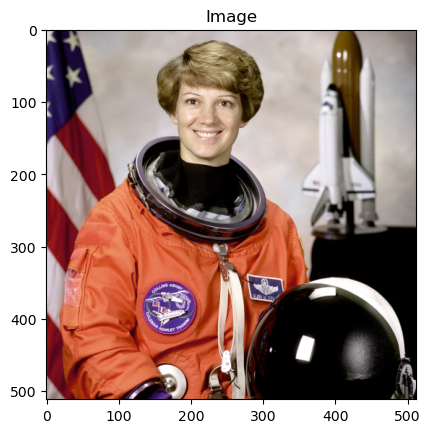

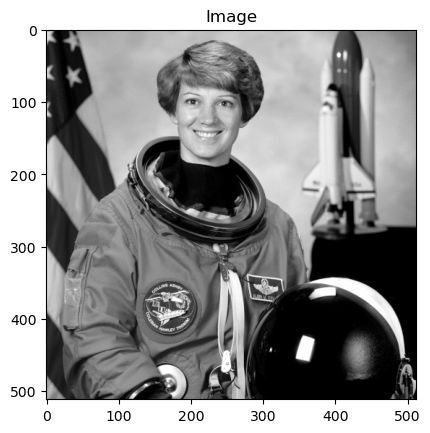

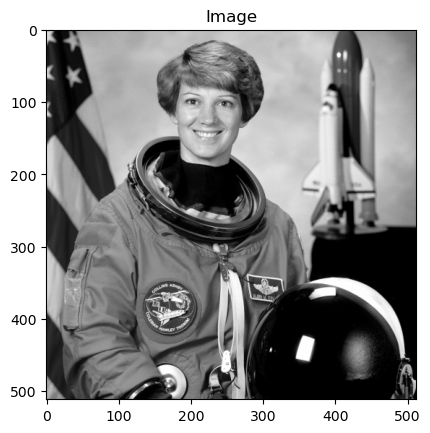

In [7]:
show_image(astronaut)
show_image(astronaut_gray)
show_image(astronaut_rgb)

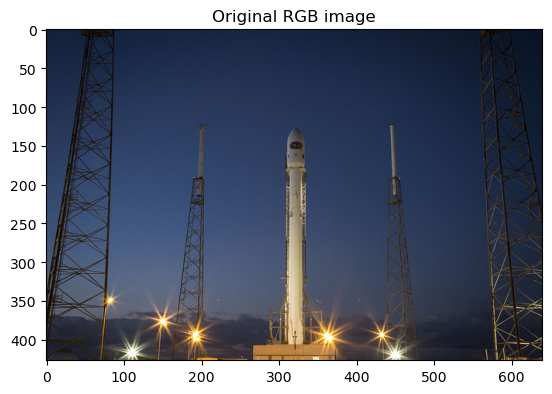

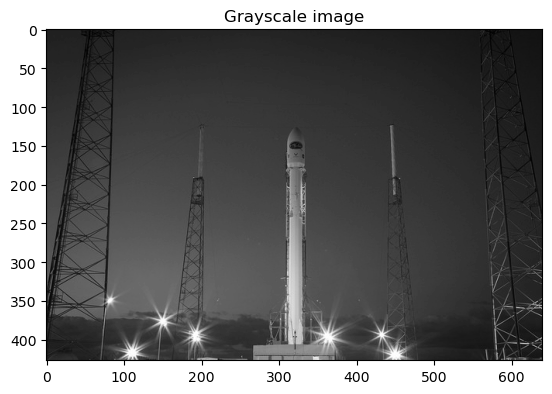

In [8]:
# Complete example
# Import the modules from skimage
from skimage import io, data, color


# Load the rocket image
rocket = data.rocket()

# Convert the image to grayscale
rocket_gray = color.rgb2gray(rocket)

# Show the original image
show_image(rocket, 'Original RGB image')

# Show the grayscale image
show_image(rocket_gray, 'Grayscale image')

## 1.2 NumPy for images
With NumPy, we can practice simple image processing techniques, such as:
- flipping images
- extracting features and analyzing them

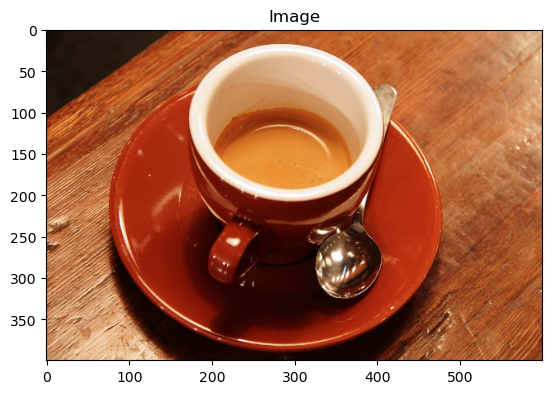

In [9]:
# Download image
coffee=data.coffee()
show_image(coffee)

In [10]:
# Type of image
type(coffee)

# Obtainin the red values of the image
red=coffee[:, :, 0]

# Obtainin the green values of the image
green=coffee[:, :, 1]

# Obtainin the blue values of the image
blue=coffee[:, :, 2]

In [11]:
red, green, blue

(array([[ 21,  21,  20, ..., 228, 231, 228],
        [ 21,  21,  20, ..., 228, 231, 229],
        [ 21,  23,  20, ..., 228, 228, 229],
        ...,
        [189, 214, 197, ..., 165, 161, 143],
        [207, 201, 196, ..., 154, 147, 145],
        [197, 195, 193, ..., 158, 144, 143]], dtype=uint8),
 array([[ 13,  13,  11, ..., 182, 185, 184],
        [ 13,  13,  14, ..., 182, 185, 183],
        [ 14,  13,  14, ..., 182, 184, 185],
        ...,
        [124, 155, 141, ...,  86,  82,  67],
        [148, 142, 140, ...,  74,  66,  65],
        [141, 137, 138, ...,  73,  64,  60]], dtype=uint8),
 array([[  8,   9,   8, ..., 138, 142, 140],
        [  7,   9,   7, ..., 136, 139, 137],
        [  7,  10,   9, ..., 136, 137, 138],
        ...,
        [ 77, 109, 100, ...,  37,  41,  29],
        [102,  99,  97, ...,  37,  33,  31],
        [100,  99,  98, ...,  38,  30,  29]], dtype=uint8))

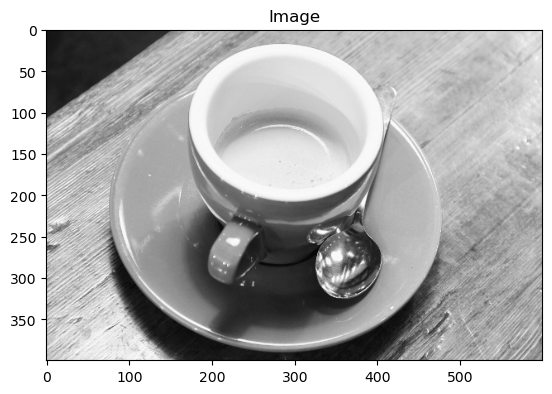

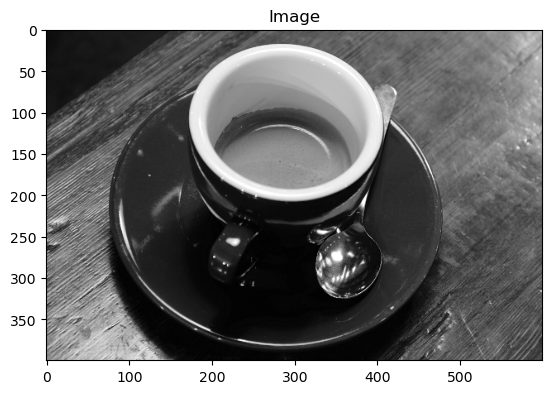

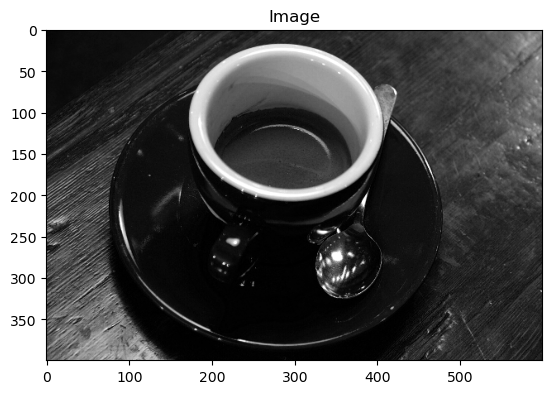

In [12]:
# Show the image with cmap_type='gray'
show_image(red)
show_image(green)
show_image(blue)

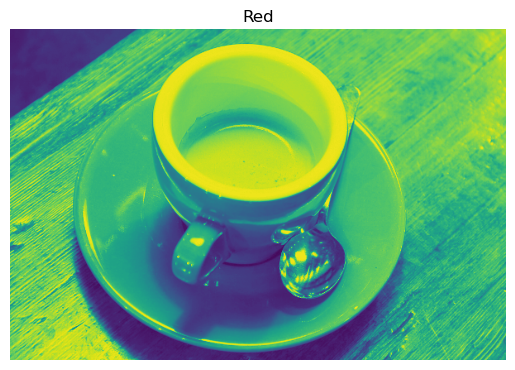

In [13]:
# Colors with NumPy

plt.imshow(red)
plt.title('Red')
plt.axis("off")
plt.show()

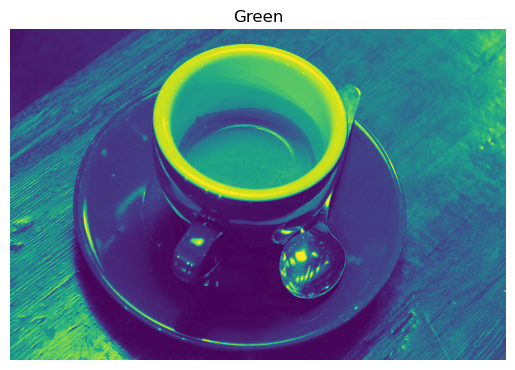

In [14]:
plt.imshow(green,)
plt.title('Green')
plt.axis("off")
plt.show()

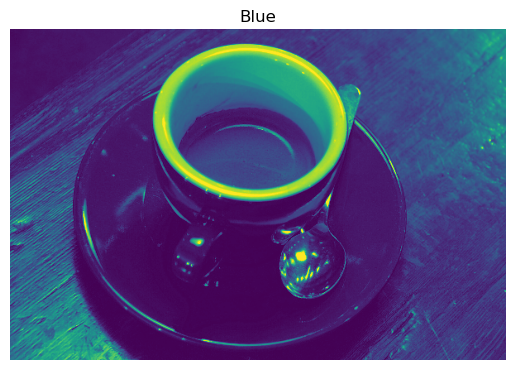

In [15]:
plt.imshow(blue, )
plt.title('Blue')
plt.axis("off")
plt.show()

In [16]:
# Shape of the image, size of image

coffee.shape, coffee.size

((400, 600, 3), 720000)

### We can flip the image vertically by using the flipud() method (up-down)

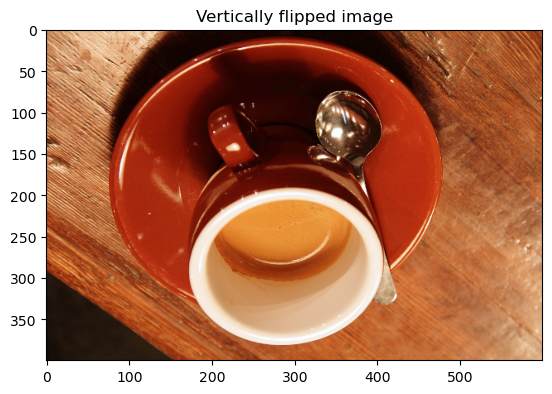

In [17]:
# Flip the image in up direction

vertically_flipped=np.flipud(coffee)
show_image(vertically_flipped, 'Vertically flipped image')

### We can flip the image horizontally by using the fliplr() method (left-right)

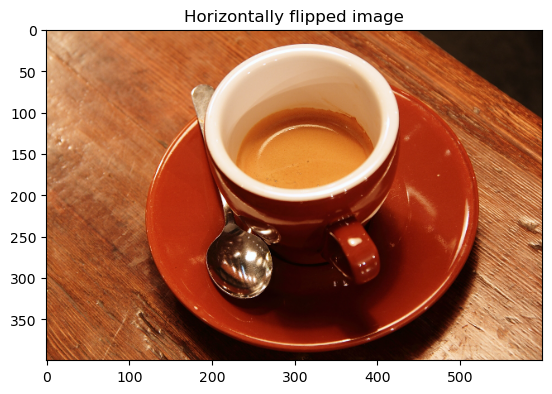

In [18]:
# Flip the image in horizontally

horizontally_flipped=np.fliplr(coffee)
show_image(horizontally_flipped, 'Horizontally flipped image')

### The histogram of an image is a graphical representation of the amount of pixels of each intensity value. From 0 (pure black) to 255(pure white)

- Application of histogram:
    - Analysis
    - Thresholding
    - Brightness and contrast
    - equalize an image
  
#### Histograms in Matplotlib

Matplotlib has a histogram method. It takes an input array (frequency) and bins as parameters. The successive elements in bin array act as the boundary of each bin. We obtain the red color channel of the image by slicing it. We then use the histogram function. Use ravel to return a continuous flattened array from the color values of the image, in this case red. And pass this ravel and the bins as parameters. We set bins to 256 because we'll show the number of pixels for every pixel value, that is, from 0 to 255. Meaning you need 256 values to show the histogram.

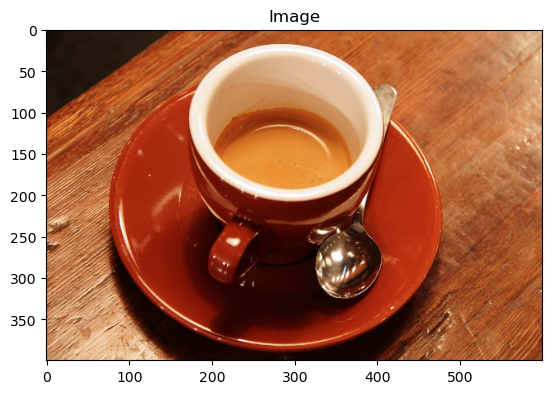

In [19]:
show_image(coffee)

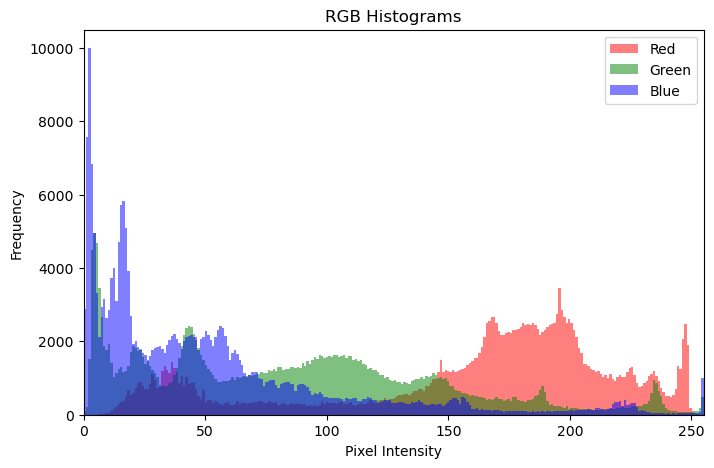

In [20]:
# Method 2: Overlaying All Histograms in One Plot

plt.figure(figsize=(8, 5))
plt.hist(red.ravel(), bins=256, color='red', alpha=0.5, label='Red')
plt.hist(green.ravel(), bins=256, color='green', alpha=0.5, label='Green')
plt.hist(blue.ravel(), bins=256, color='blue', alpha=0.5, label='Blue')
plt.title('RGB Histograms')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()
plt.xlim(0, 255)
plt.show()

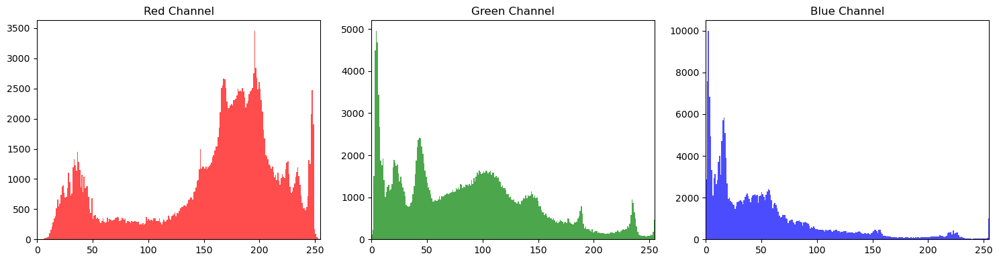

In [21]:
# Method 1: Using plt.subplots()

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Plot histograms
axes[0].hist(red.ravel(), bins=256, color='red', alpha=0.7)
axes[0].set_title('Red Channel')
axes[0].set_xlim(0, 255)

axes[1].hist(green.ravel(), bins=256, color='green', alpha=0.7)
axes[1].set_title('Green Channel')
axes[1].set_xlim(0, 255)

axes[2].hist(blue.ravel(), bins=256, color='blue', alpha=0.7)
axes[2].set_title('Blue Channel')
axes[2].set_xlim(0, 255)

plt.tight_layout()  # Adjust spacing
plt.show()

## 1.3 Thresholding
Thresholding is the simplest method of image segmentation, and is used to partition the background and foreground of grayscale images, by essentially making them black and white. We compare each pixel to a given threshold value. If the pixel is less than that value, we turn it white. If it's greater; we turn it black

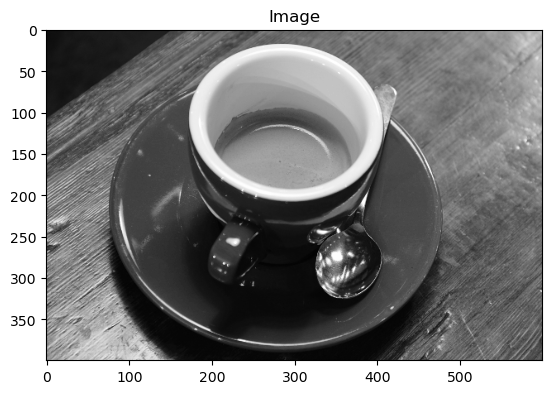

In [22]:
# Transform it to gray
coffee_gray = color.rgb2gray(coffee)
show_image(coffee_gray)

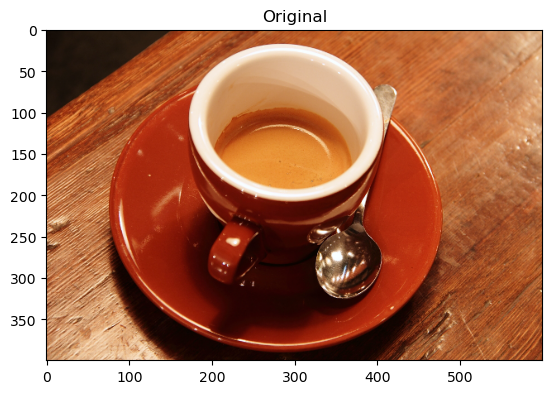

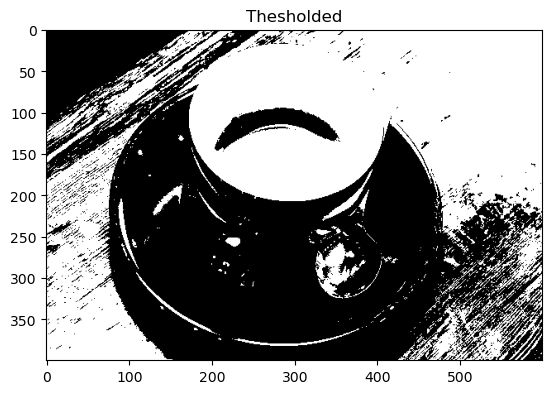

In [23]:
# Aply the threshloding

# Obtain the optimal threshold value using Otsu's method
thresh = filters.threshold_otsu(coffee_gray)

# Apply thresholding to the image
binary=coffee_gray > thresh

# Show the original, grayscale, and thresholded images
show_image(coffee, "Original")
show_image(binary, "Thesholded")

We can also apply inverted thresholding, which is just inverting the color. We apply it just as we do in thresholding, except we use "<=" operator instead of ">". Here the resulting image is also binary but the background is black and foreground white.

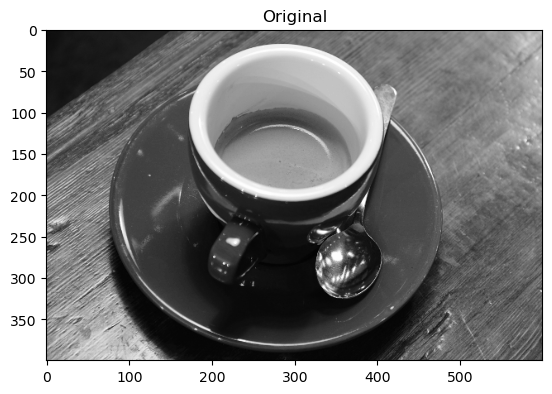

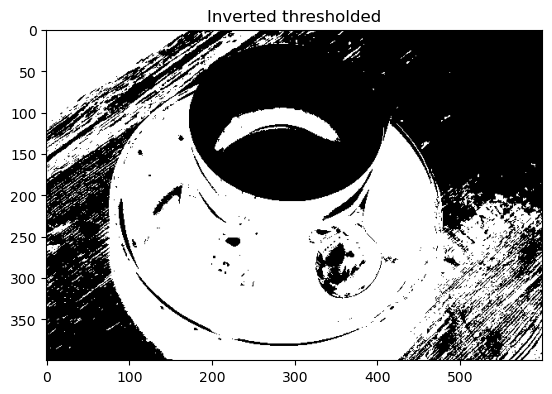

In [24]:
# Obtain the optimal threshold value using Otsu's method
thresh = filters.threshold_otsu(coffee_gray)

# Apply thresholding to the image
inverted_binary=coffee_gray <= thresh

# Show the original, grayscale, and thresholded images
show_image(coffee_gray, "Original")
show_image(inverted_binary, "Inverted thresholded")

## Categories of thresholding
- Global or histogram based: good for uniform background
- Local or adaptive: for uneven backgound illumination

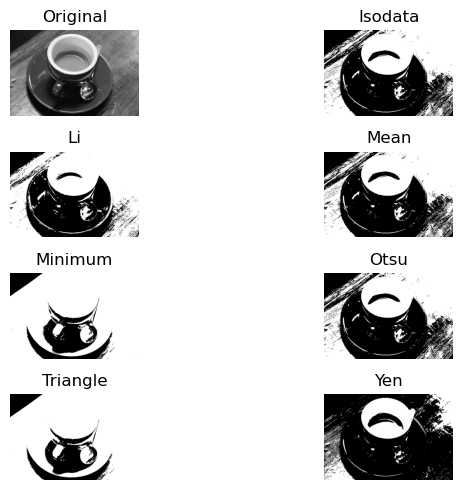

In [25]:
from skimage.filters import try_all_threshold

# Obtain all the resulting images
fig, ax=try_all_threshold(coffee_gray, verbose=False)

# Showin resulting plots
plt.show(fig, ax)

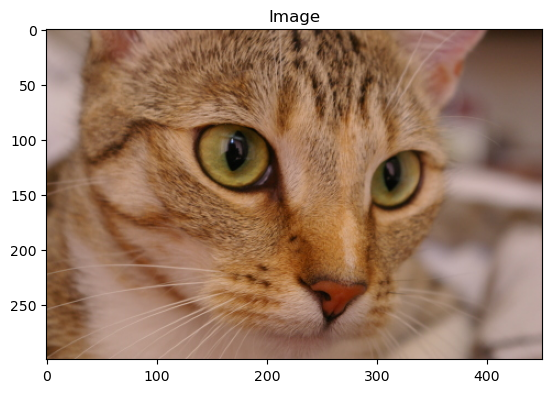

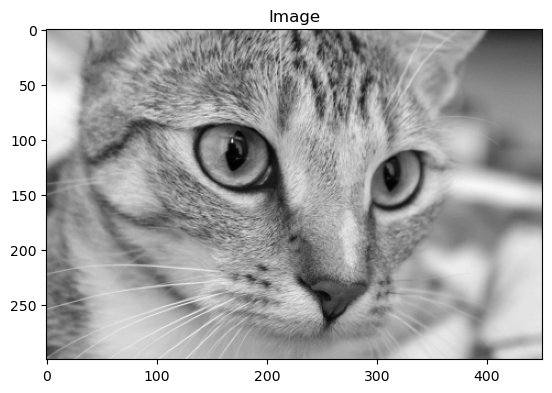

In [26]:
chelsea=data.chelsea()
show_image(chelsea)
chelsea_gray=color.rgb2gray(chelsea)
show_image(chelsea_gray)

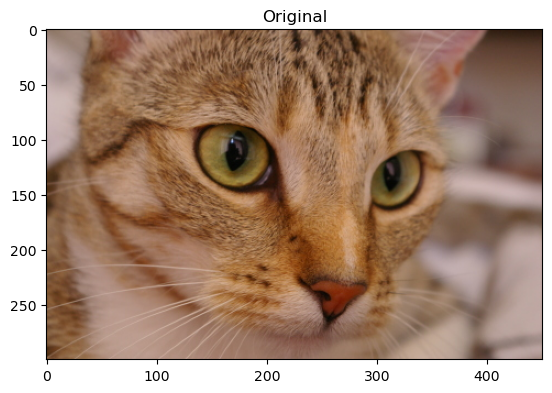

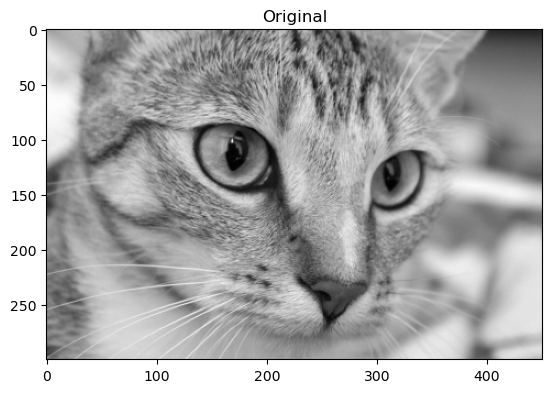

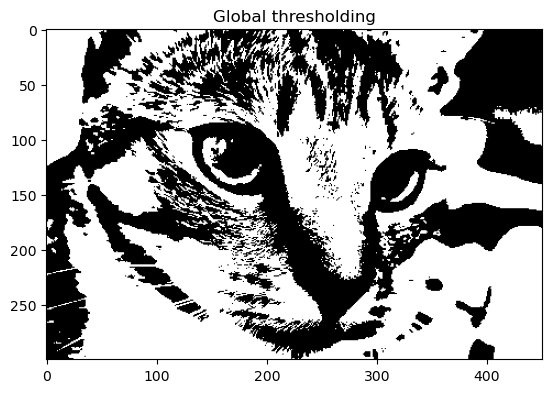

In [27]:
# Glopal uniform background
from skimage.filters import threshold_otsu

# Obtain the optimal threshold value
thresh=threshold_otsu(chelsea_gray)

# Apply thresholding to the image
binary_global= chelsea_gray>thresh

# Show the original and bianarized image
show_image(chelsea, "Original")
show_image(chelsea_gray, "Original")
show_image(binary_global, 'Global thresholding')

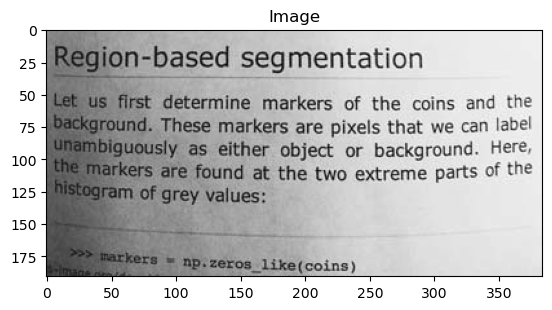

In [28]:
# Local uneven backgound

page=data.page()
show_image(page)

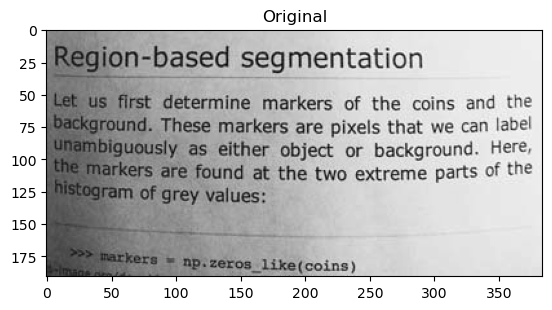

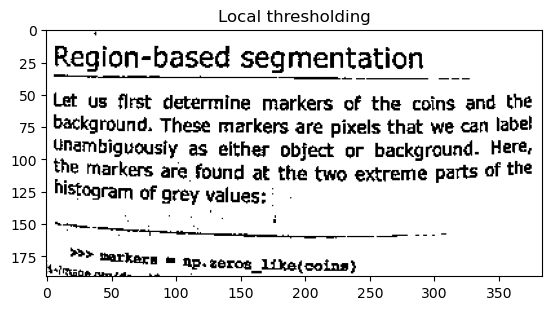

In [29]:
# Import the local threshol function
from skimage.filters import threshold_local

# Set the block size to 35
block_size=35

# Obtain the optimal local thresholding
local_thresh=threshold_local(page, block_size, offset=10)

# Apply local thresholding and obtain the binary image
binary_local=page>local_thresh

# show the original and binarized image
show_image(page, "Original")
show_image(binary_local, "Local thresholding")

---
## 2.1 Filtering
Filtering is a technique for modifying or enhancing an image. In essence, a filter is a mathematical function that is applied to images. It can be used to emphasize or remove certain features, like edges. Smoothing, sharpening and edge detection.

### Neighborhoods
Certain image processing operations involve processing an image in sections, called blocks or neighborhoods, rather than processing the entire image at once. This is the case for filtering, histogram equalization for contrast enhancement, and morphological functions, all three of which use this approach.

### 2.1.1 Edge detection¶
With filtering we can detect edges. This technique can be used to find the boundaries of objects within images. As well as segment and extract information like how many coins are in an image. Most of the shape information of an image is enclosed in edges.

Edge detection works by detecting discontinuities in brightness.

A common edge detection algorithm is Sobel. This is a filter that we can find in scikit image's module filters with the sobel function.

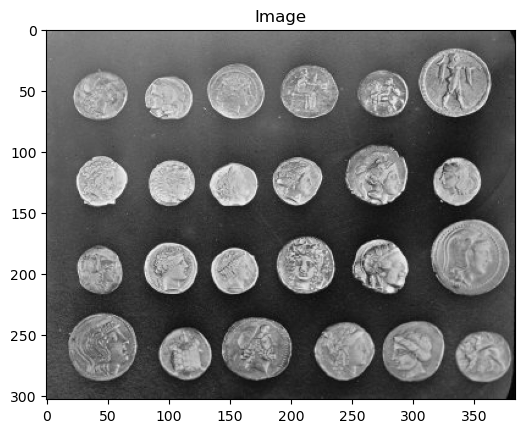

In [30]:
# Down load the impage (already in gray scale)
coins=data.coins()
show_image(coins)

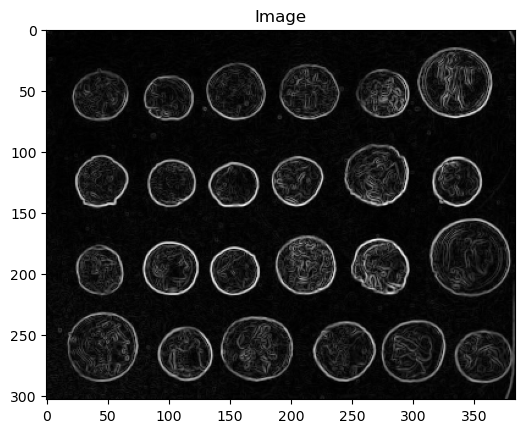

In [31]:
# Import module and function
from skimage.filters import sobel

# Apply edge detection filter
edge_sobel=sobel(coins)
show_image(edge_sobel)

In [32]:
# As function
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2)=plt.subplots(ncols=2, figsize=(8,6), sharex=True, sharey=True)
    
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title("Original")
    ax1.axis("off")
    
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis("off")

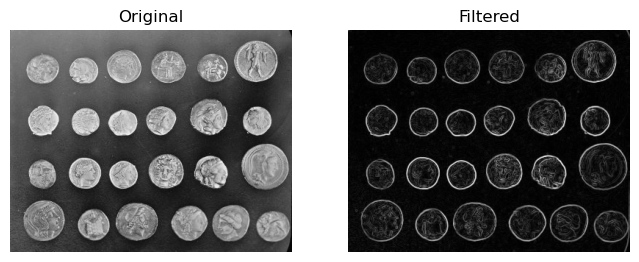

In [33]:
plot_comparison(coins, edge_sobel, "Filtered")

### 2.1.2 Smoothing
Gaussian smoothing is another filtering technique. We can achieve this with a Gaussian filter. This technique is typically used to blur an image or to reduce noise.

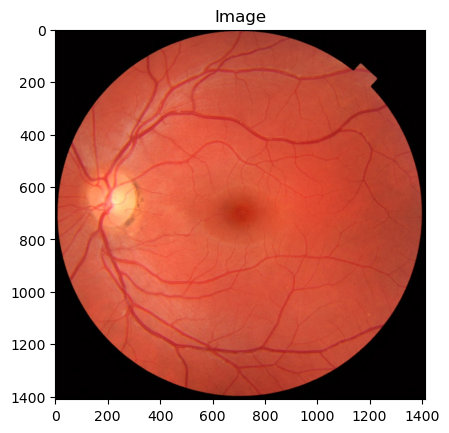

In [34]:
retina=data.retina()
show_image(retina)

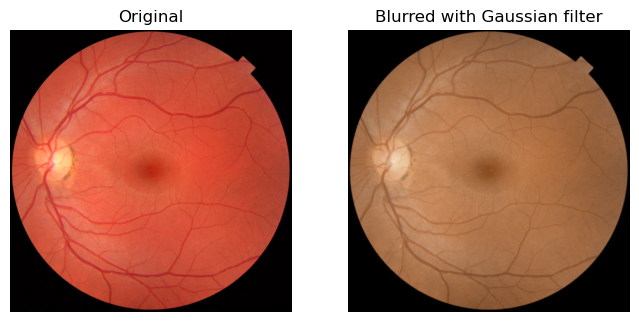

In [35]:
# Import the module and function
from skimage.filters import gaussian

# Apply edge detection filter
retina_gaussian=gaussian(retina)

# Show original and resulting image to compare
plot_comparison(retina, retina_gaussian, "Blurred with Gaussian filter")

### 2.2 Contrast enhancement
The contrast of an image can be understood as a measure of its dynamic range—the difference between the brightest and darkest pixels. This is often reflected in the 'spread' of its histogram. In other words, high contrast means a wide distribution of intensities (from very dark to very bright), while low contrast means pixel values are clustered in a narrow range.

To inhance contrast we use:
- Contrast stretching
- Histogram equalization

Type of histogram equalization:
- Histogram equalization
- Adaptive histogram equalization
- Contrast Limited Adaptie Histogram Equalization(CLAHE)

In [36]:
# Obtain data
moon=data.moon()

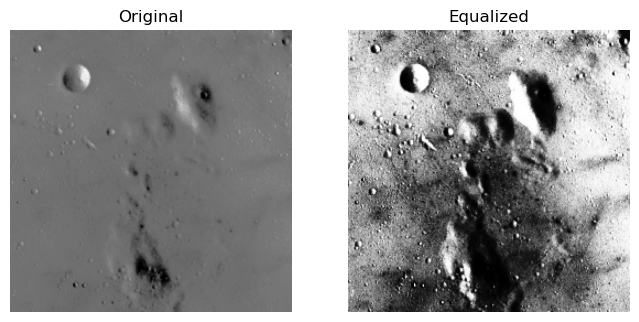

In [37]:
# Histogram equalization

from skimage import exposure

# Obtain the equalized image
moon_eq=exposure.equalize_hist(moon)

# Show 
plot_comparison(moon, moon_eq, "Equalized")

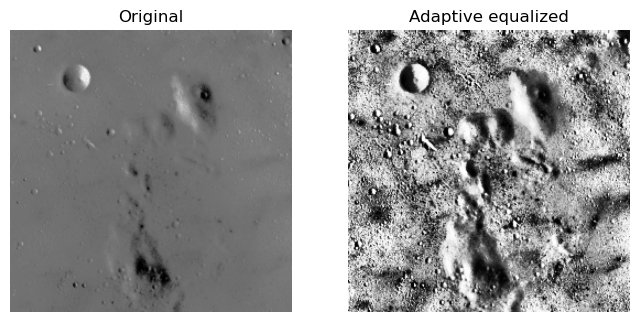

In [38]:
# CLAHE equalization

# Apply adaptive equalization
moon_adapteq=exposure.equalize_adapthist(moon, clip_limit=0.3)

# Show the result
plot_comparison(moon, moon_adapteq, "Adaptive equalized")

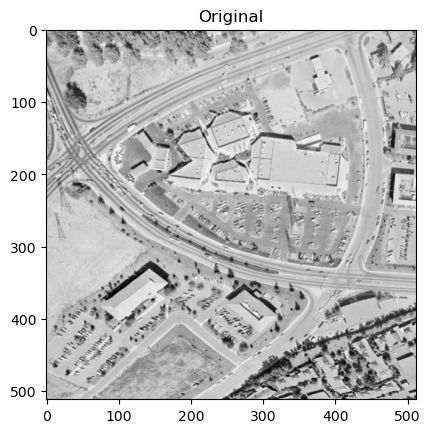

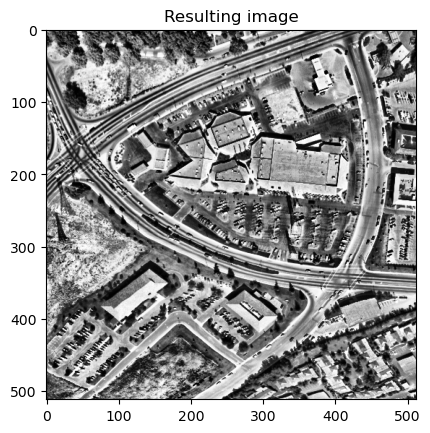

In [39]:
# Example - Aerial
image_aerial=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 2\\image_aerial.tiff")

# Import the required module
from skimage import exposure

# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_adapthist(image_aerial, clip_limit=0.3)

# Show the original and resulting image
show_image(image_aerial, 'Original')
show_image(image_eq, 'Resulting image')

### 2.3 Transformations
Sometimes we might need to transform images by rotating or resizing them.
- Preparing images for classification Machine Learning model
- Optimaization and compression of image
- Save images wih same proportion

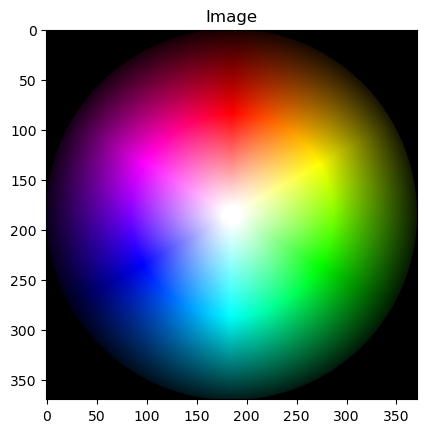

In [40]:
colorwheel=data.colorwheel()
show_image(colorwheel)

### 2.3.1 Rotating-clockwise or anticlockwise

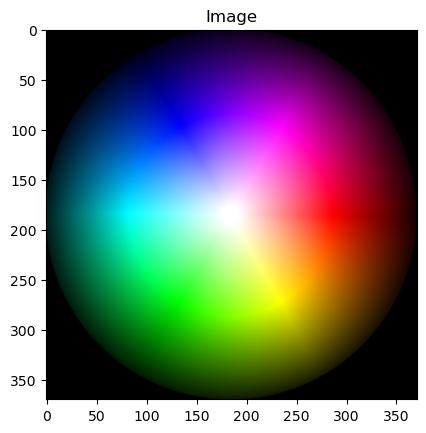

In [41]:
# Rotating clockwise
from skimage.transform import rotate

# Rotate the image 90 degree colockwisse
image_rotate=rotate(colorwheel, -90)
show_image(image_rotate)

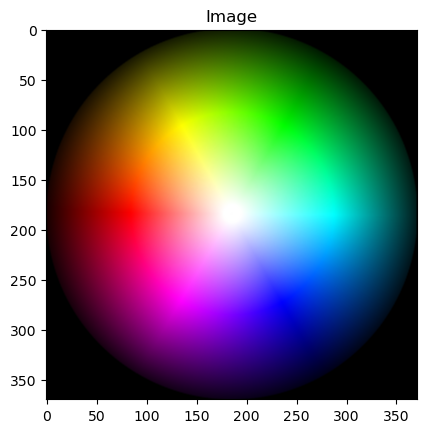

In [42]:
# Rotating anticlockwise
from skimage.transform import rotate

# Rotate the image 90 degree colockwisse
image_rotate=rotate(colorwheel, 90)

show_image(image_rotate)

### 2.3.2 Rescaling

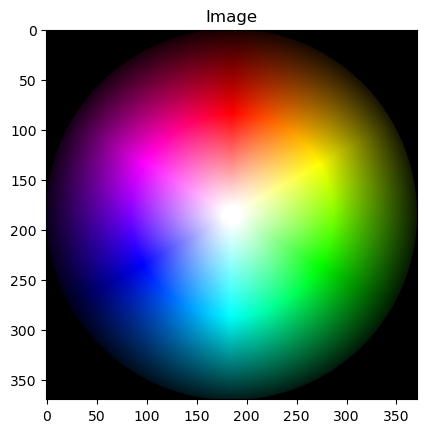

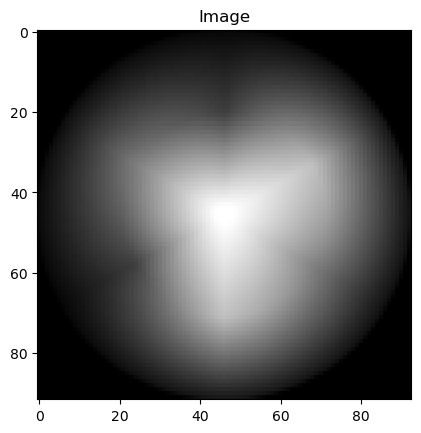

In [43]:
# Downgrading
from skimage.transform import rescale

# Rescale the image to be 4 time smaller
colorwheel_rescaled=rescale(colorwheel, 0.25, anti_aliasing=True)

show_image(colorwheel)
show_image(colorwheel_rescaled)

In [44]:
colorwheel.size, colorwheel_rescaled.size

(411810, 8556)

### 2.3.3 Resizing

(411810, 600000)

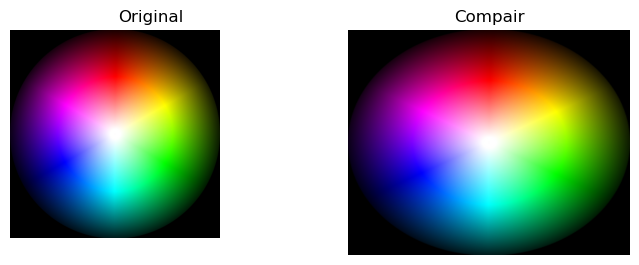

In [45]:
from skimage.transform import resize

# Height and width to resize
height=400
width=500

# Resize image
colorwheel_resized=resize(colorwheel, (height, width), anti_aliasing=True)

# show the original and resulting images
plot_comparison(colorwheel, colorwheel_resized, "Compair")
colorwheel.size, colorwheel_resized.size

(411810, 25668)

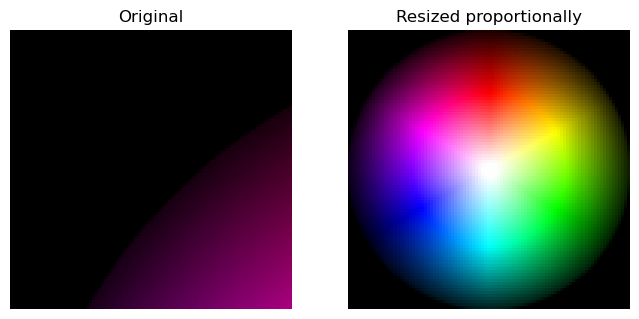

In [46]:
# Resizing proportionally

from skimage.transform import resize

# Set proportional height so its 4 times its size
height=colorwheel.shape[0]/4
width=colorwheel.shape[1]/4

# Resize image
colorwheel_resized=resize(colorwheel, (height, width), anti_aliasing=True)

# show the original and resulting images
plot_comparison(colorwheel, colorwheel_resized, "Resized proportionally")
colorwheel.size, colorwheel_resized.size

### 2.4 Morphology
Morphology is to spot objects in an image by its characteristics, like the shape.

Basic morphological operations are dilation and erosion.
- Dilation adds pixels to the boundaries of objects in an image
- Erosion removes pixels on object boundaries

The number of pixels added or removed from the objects in an image depends on the size and shape of a structuring element used to process the image.

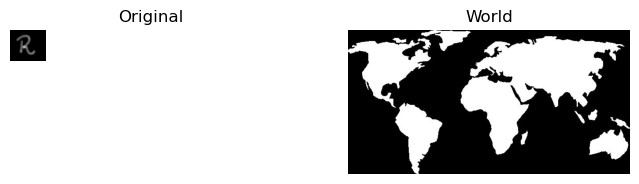

In [47]:
r5=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 2\\r5.png")
world=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 2\\world_image_binary.jpg")
plot_comparison(r5, world, "World")

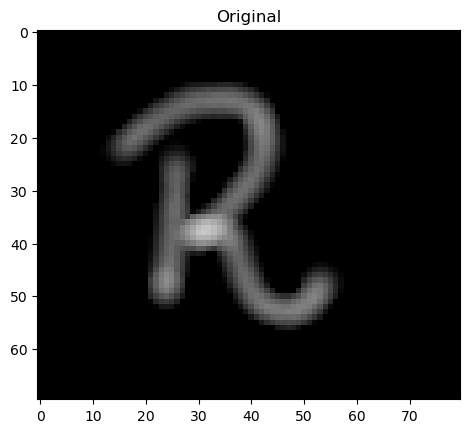

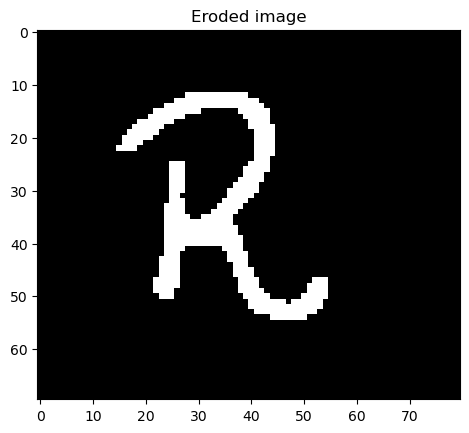

In [48]:
# Binary Erosion

from skimage import color, filters, morphology

# Convert RGB to grayscale
gray_r5 = color.rgb2gray(r5)  # Now shape is (70, 80), values in [0, 1]

# Apply Otsu's threshold
threshold_value = filters.threshold_otsu(gray_r5)
binary_r5 = gray_r5 > threshold_value  # Binary image (True/False)

# Perform erosion
eroded_image = morphology.binary_erosion(binary_r5)

# See results
show_image(r5, 'Original')
show_image(eroded_image, 'Eroded image')

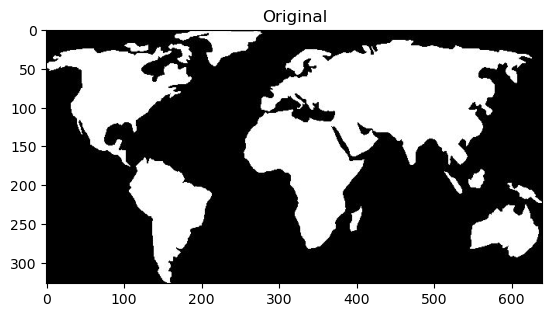

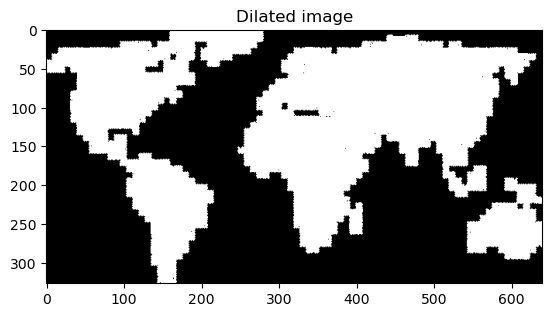

In [49]:
# Binary Dilation

from skimage import morphology

# Obtain the dilated image 
dilated_image = morphology.binary_dilation(world)

# See results
show_image(world, 'Original')
show_image(dilated_image, 'Dilated image')

---
### 3. Image restoration, Noise, Segmentation and Contours

### 3.1 Image Restoration with Inpainting
- Introduction to Image Restoration
    - Goal: Reconstruct damaged or deteriorated images (e.g., scratches, corrupted files).
    - Applications:
        - Repairing old photos.
        - Removing unwanted objects (text, logos, tattoos).
        - Fixing corrupted images.

- Inpainting: The Core Technique
    - Definition: Automatically reconstruct lost/damaged pixels using information from intact regions.
    - Tool: inpaint_biharmonic in scikit-image (uses a biharmonic equation for smooth interpolation).
- Key Steps for Inpainting
    - Mask Creation:
        - A mask (binary array) marks damaged pixels (1 = unknown, 0 = known).
        - Methods:
            - Manual delineation (e.g., blacking out scratches).
            - Automatic detection (thresholding/segmentation, covered later).
- Practical Example
    - Process:
        - Load damaged image (e.g., old photo with scratches).
        - Create a mask (same dimensions as image) with 1s at damaged pixels.
        - Apply inpaint_biharmonic to reconstruct missing areas.
        - Result: Damaged pixels are filled seamlessly using surrounding data.
- Mask Requirements
    - Shape: Must match image dimensions (e.g., (height, width) for grayscale; exclude RGB channels).
    - Values:
    - 1 (or True): Pixels to reconstruct.
    - 0 (or False): Intact pixels.

- Applications Beyond Restoration
    - Object Removal: Mask unwanted objects (e.g., watermarks, tattoos).
    - Automation: Combine with segmentation for detecting damaged regions.

In [50]:
import numpy as np
from skimage.restoration import inpaint
import matplotlib.pyplot as plt

In [51]:
image_with_logo=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 3\\4.2.06_w_logo_2_2.png")
image_with_logo.shape

(296, 512, 3)

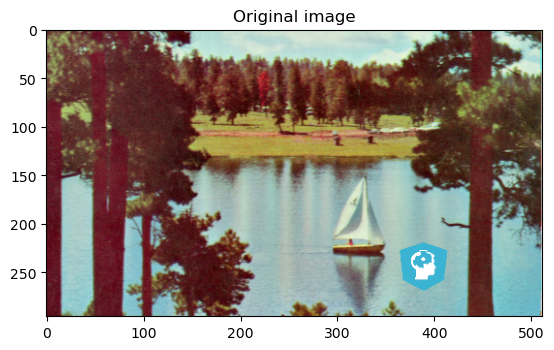

In [52]:
show_image(image_with_logo, "Original image")

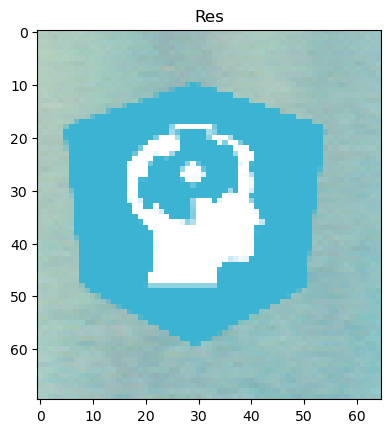

In [53]:
show_image(image_with_logo[210:280, 360:425], "Res")

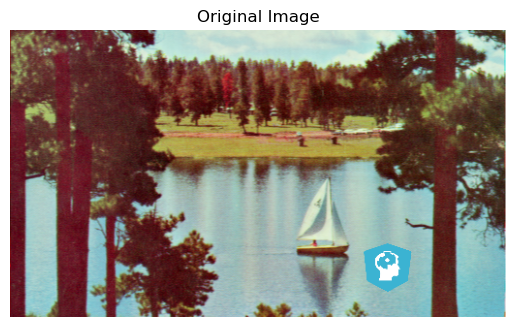

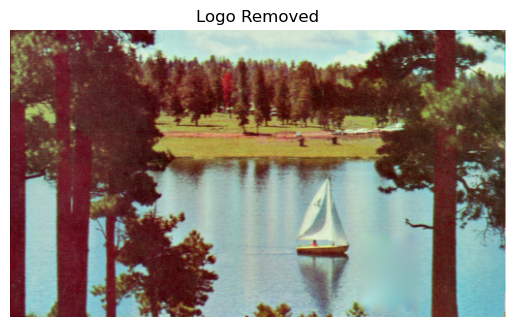

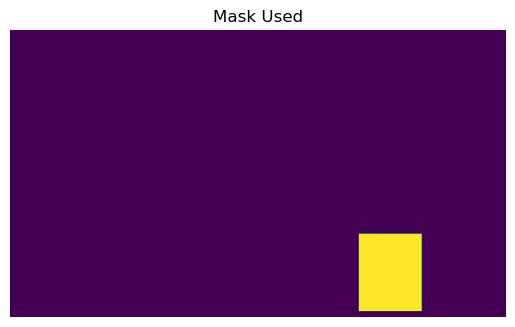

In [54]:
def show_image(image, title):
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Load your image (example - replace with your actual image)
# image_with_logo = plt.imread('your_image.jpg')

# 1. Ensure proper image format
if image_with_logo.ndim == 3:
    # If channels-first (C, H, W), convert to channels-last (H, W, C)
    if image_with_logo.shape[0] < image_with_logo.shape[-1]:
        image_with_logo = np.moveaxis(image_with_logo, 0, -1)

# 2. Create mask with correct shape and type
mask = np.zeros(image_with_logo.shape[:2], dtype=bool)  # (H, W) for grayscale/RGB

# 3. Define logo area (adjust coordinates as needed)
mask[210:290, 360:425] = True

# 4. Apply inpainting with proper channel handling
try:
    # Try channels-last approach first
    image_logo_removed = inpaint.inpaint_biharmonic(image_with_logo, mask, channel_axis=-1)
except ValueError:
    # Fallback to grayscale if needed
    if image_with_logo.ndim == 3:
        gray_image = image_with_logo.mean(axis=-1)
        image_logo_removed = inpaint.inpaint_biharmonic(gray_image, mask)
    else:
        image_logo_removed = inpaint.inpaint_biharmonic(image_with_logo, mask)

# 5. Display results
show_image(image_with_logo, 'Original Image')
show_image(image_logo_removed, 'Logo Removed')
show_image(mask, 'Mask Used')

### 3.2 Noise

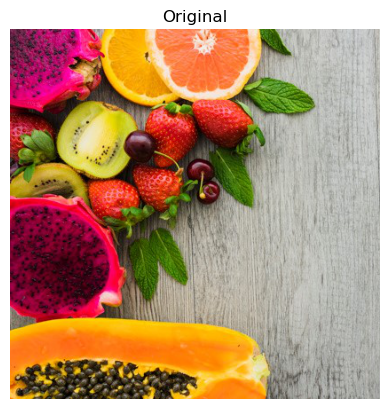

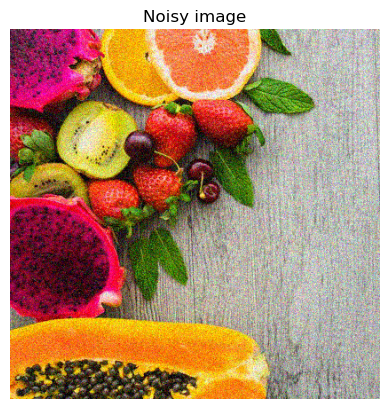

In [55]:
# Add Noise

fruit_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 3\\fruits_square.jpg")


# Import the module and function
from skimage.util import random_noise

# Add noise to the image
noisy_fruit_image = random_noise(fruit_image)

# Show original and resulting image
show_image(fruit_image, 'Original')
show_image(noisy_fruit_image, 'Noisy image')

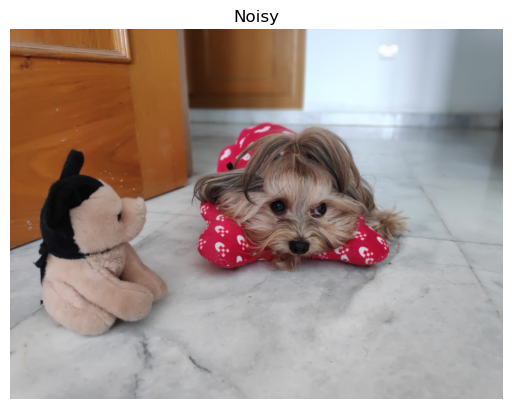

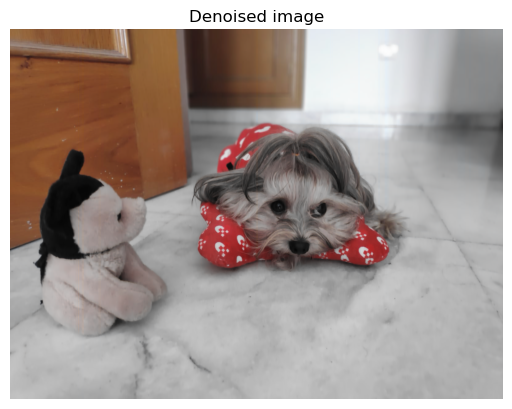

In [56]:
# # Remove Noise

noisy_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 3\\miny.jpeg")


# Import the module and function
from skimage.restoration import denoise_tv_chambolle

# Apply total variation filter denoising
denoised_image = denoise_tv_chambolle(noisy_image, weight=0.05,
                                      channel_axis=True)

# Show the noisy and denoised images
show_image(noisy_image, 'Noisy')
show_image(denoised_image, 'Denoised image')    

C:\Users\abdul\anaconda3\Lib\site-packages\skimage\_shared\utils.py:470: UserWarning: The last axis of the input image is interpreted as channels. Input image with shape (1216, 3, 1824) has 1824 channels in last axis. ``denoise_bilateral``is implemented for 2D grayscale and color images only.
  out = func(*new_args, **kwargs)


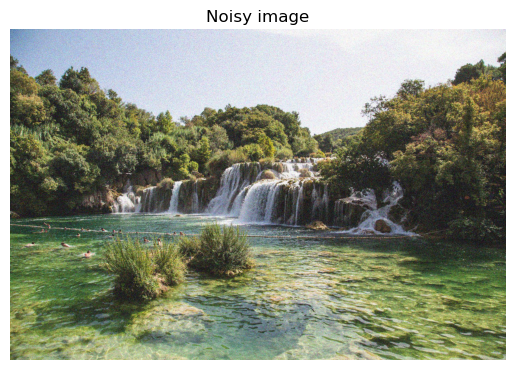

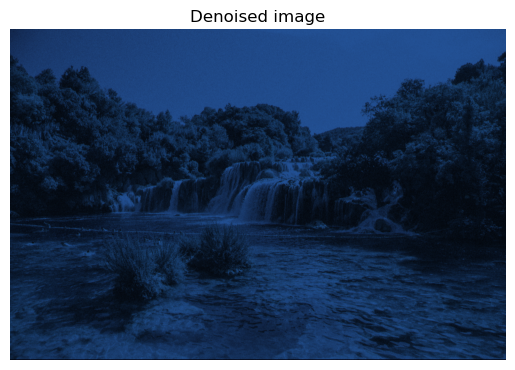

In [57]:
noise_noise_nature=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 3\\noise-noisy-nature.jpg")

# Import bilateral denoising function
from skimage.restoration import denoise_bilateral

# Apply bilateral filter denoising
denoised_image = denoise_bilateral(noise_noise_nature, channel_axis=True)

# Show original and resulting images
show_image(noise_noise_nature, 'Noisy image')
show_image(denoised_image, 'Denoised image')

###
### **Superpixels & Segmentation**  
Superpixels enhance image analysis by grouping similar pixels, improving efficiency and interpretability in tasks like medical imaging and object recognition. SLIC is a popular unsupervised method for superpixel segmentation.

- **Introduction to Segmentation**
   - Image segmentation partitions an image into meaningful regions for easier analysis.  
   - Applications include tumor detection in medical imaging and face recognition.  

- **Pixel Limitations & Superpixels**
   - Images are grids of pixels, but individual pixels lack meaningful information.  
   - **Superpixels** group similar neighboring pixels, providing more logical representations.  

- **Benefits of Superpixels** 
   - Enable feature computation on meaningful regions.  
   - Improve computational efficiency by reducing thousands of pixels to fewer regions.  

- **Types of Segmentation**
   - **Supervised:** Uses prior knowledge (e.g., manual thresholding).  
   - **Unsupervised:** Automatically segments images (e.g., Otsu thresholding).  

- **SLIC (Simple Linear Iterative Clustering)**
   - An **unsupervised** method using **K-Means clustering** to group pixels into superpixels.  
   - Implemented via the `slic()` function, which outputs labeled segments.  
   - `label2rgb()` visualizes segments with average colors.  
   - Adjusting `n_segments` (default: 100) controls the number of superpixels (e.g., 300 for finer segmentation).

In [58]:
face_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 3\\chinese.jpg")

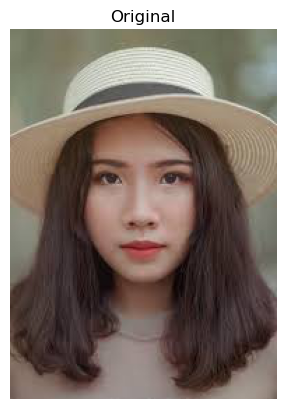

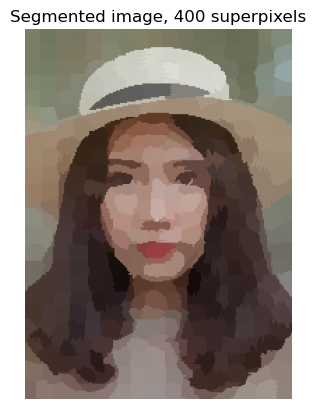

In [59]:
# Import the slic function from segmentation module
from skimage.segmentation import slic

# Import the label2rgb function from color module
from skimage.color import label2rgb

# Obtain the segmentation with 400 regions
segments = slic(face_image, n_segments= 400)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, face_image, kind='avg')

# Show the segmented image
show_image(face_image, 'Original')
show_image(segmented_image, "Segmented image, 400 superpixels")

###
### 3.4 Finding Contours in Images
- Introduction to Contours
Contours are closed shapes (lines/points) representing object boundaries.

Used for counting objects, measuring size, and shape classification (e.g., counting 35 points in domino tokens)

- Preprocessing for Contour Detection
    - Input Requirement: A binary image (objects in white, background in black)
    - Steps: Convert to grayscale (rgb2gray)
    - Apply thresholding to create a binary image

- Finding Contours with find_contours
    - Function: find_contours() (from skimage.measure)
    - Parameters:
    - Binary image
    - Level value (0 to 1): Higher values detect more complex contours
    - Output: A list of contours, each storing (x, y) coordinates

- Choosing the Level Value
Closer to 1 = More sensitive (detects finer details)
Must be tuned for optimal results
- Analyzing Contour Shapes
    - Each contour is an array of shape (n, 2) (n = number of boundary points).
        - Example (Domino Tokens):
        - 433 points: Outer borders (largest objects).
        - 401 points: Inner borders (due to token outlines).
        - 123 points: Middle dividing line.
        - 59 points: Dots (smallest contours; counted 7 dots total).


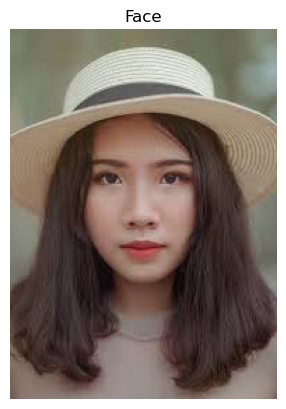

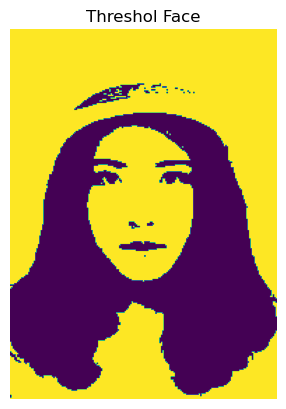

(151, 2)
(21, 2)
(9, 2)
(5, 2)
(7, 2)
(7, 2)
(19, 2)
(9, 2)
(5, 2)
(7, 2)
(13, 2)
(9, 2)
(7, 2)
(5, 2)
(5, 2)
(5, 2)
(7, 2)
(13, 2)
(7, 2)
(27, 2)
(9, 2)
(7, 2)
(461, 2)
(621, 2)
(7, 2)
(5, 2)
(5, 2)
(5, 2)
(27, 2)
(17, 2)
(5, 2)
(87, 2)
(5, 2)
(6, 2)
(479, 2)
(18, 2)
(27, 2)
(4, 2)


In [60]:
from skimage import measure, color
from skimage.filters import threshold_otsu

# Make the image grayscale
image=color.rgb2gray(face_image)

# Obtain the optimal thresh value of the image
thresh=threshold_otsu(image)

# Apply thresholding and obatin binaray image
thresholded_image=image>thresh

# Find contours at a constant value of 0.8
contours=measure.find_contours(thresholded_image, 0.8)

# Show the image
show_image(face_image, 'Face')
show_image(thresholded_image, 'Threshol Face')

for contour in contours:
    print(contour.shape)

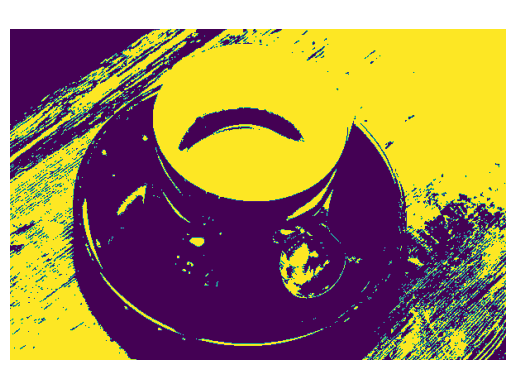

Dice's dots number: 33. 


In [62]:
# Create list with the shape of each contour
shape_contours = [cnt.shape[0] for cnt in contours]

# Set 50 as the maximum size of the dots shape
max_dots_shape = 50

# Count dots in contours excluding bigger than dots size
dots_contours = [cnt for cnt in contours if np.shape(cnt)[0] < max_dots_shape]

# Shows all contours found 
show_image(binary," ") # To see countours add it here

# Print the dice's number
print("Dice's dots number: {}. ".format(len(dots_contours)))

###
---
### 4.1 Canny Edge Detection
Detecting edges, corners, and faces in images efficiently. Edge detection helps segment images into different object regions by extracting shape information while reducing data volume
- Key Points:
    - Importance of Edges – Edges contain crucial shape information (e.g., domino tokens) and simplify image representation

    - Canny Edge Detection – A widely used, accurate, and fast method compared to Sobel filtering
- Implementation Steps:
    - Convert the image to grayscale (using rgb2gray from scikit-image)
    - Apply the canny function (from skimage.feature), which highlights edges as white lines
- Gaussian Filtering – The Canny algorithm first applies a Gaussian filter to reduce noise
    - Adjustable via the sigma parameter:
        - Low sigma (e.g., 0.5): More edges detected (less smoothing).
        - High sigma: Fewer edges (stronger noise removal). Default is 1
- Result – Edges appear as thick white lines, clearly outlining shapes (e.g., coin boundaries).

This method efficiently balances noise reduction and edge detection, making it a standard in image processing.

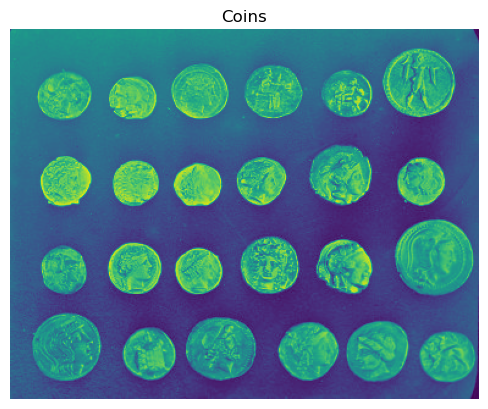

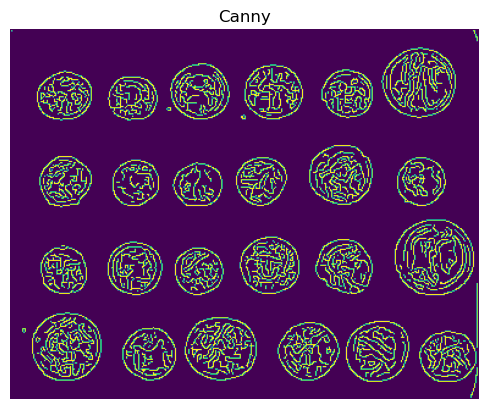

In [63]:
from skimage import color, data
from skimage.feature import canny
import pandas as pd, matplotlib.pyplot as plt

# Download the image coins
coins=data.coins()

# Convert image to grayscale
#coins=color.rgb2gray(coins)

# Apply Canny detector
canny_edges=canny(coins)

# Show the result
show_image(coins, "Coins")
show_image(canny_edges, 'Canny')

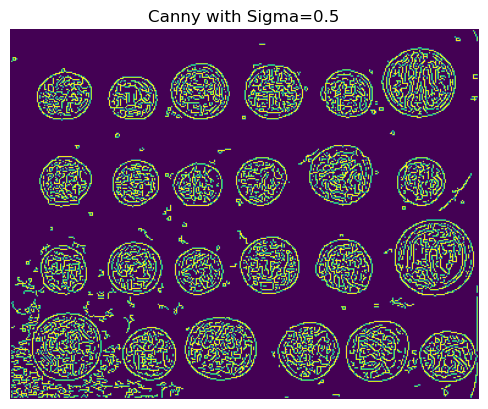

In [64]:
# Apply Canny detector with a sigma of 0.5
canny_edges_0_5=canny(coins, sigma=0.5)
show_image(canny_edges_0_5, 'Canny with Sigma=0.5')

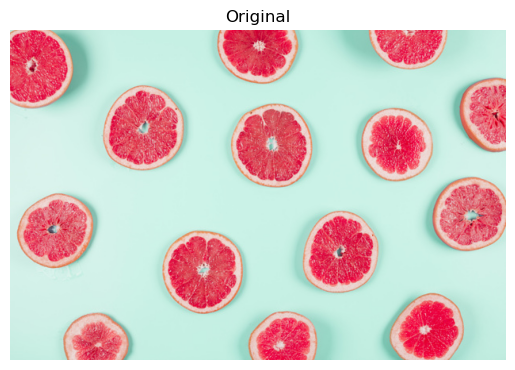

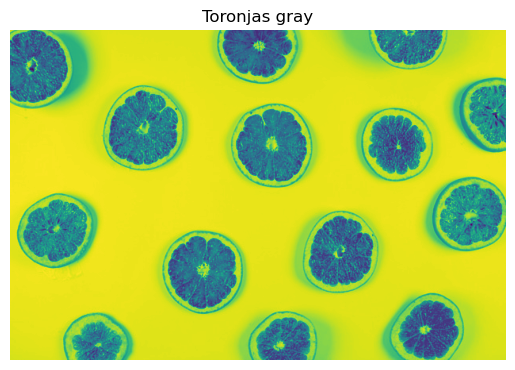

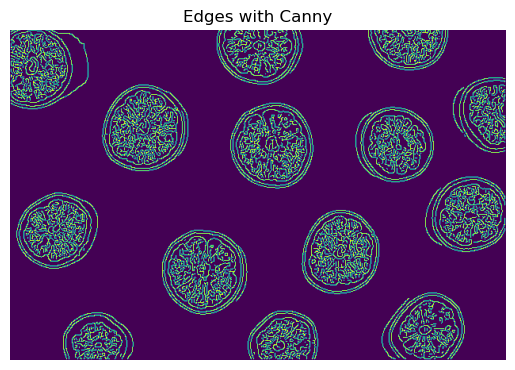

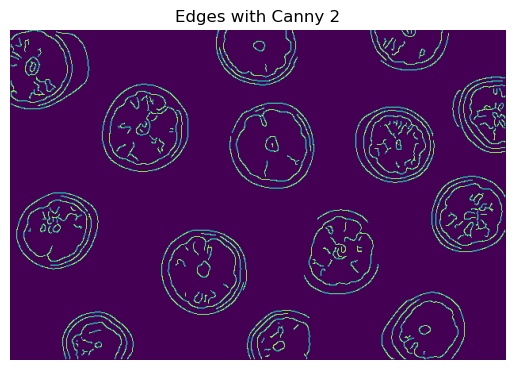

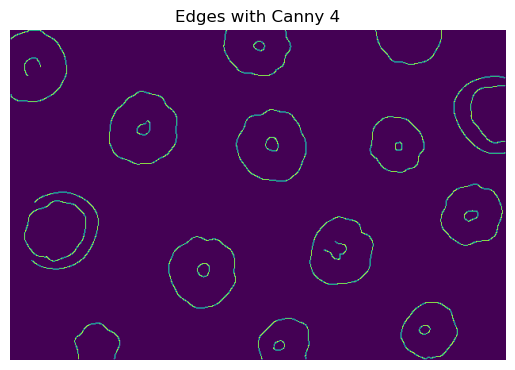

In [65]:
# Example 2
toronjas=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 4\\toronjas.jpg")
toronjas.shape

# Import the canny edge detector 
from skimage.feature import canny

# Convert image to grayscale
toronjas_gray = color.rgb2gray(toronjas)

# Apply canny edge detector
toronjas_gray_edges = canny(toronjas_gray)
toronjas_gray_edges_2 = canny(toronjas_gray, sigma=2.0)
toronjas_gray_edges_4= canny(toronjas_gray, sigma=4.0)

# Show resulting image
show_image(toronjas, 'Original')
show_image(toronjas_gray, "Toronjas gray")
show_image(toronjas_gray_edges, "Edges with Canny")
show_image(toronjas_gray_edges_2, "Edges with Canny 2")
show_image(toronjas_gray_edges_4, "Edges with Canny 4")

###
### 4.2 Harris corner detector
Detect corners is a key feature in computer vision used in applications like motion detection, 3D modeling, and object recognition.
- Key Points:
    - What are Corners?
        - Corners are points where two edges meet (e.g., checkerboard intersections, building edges).
        - They are invariant to rotation, scaling, and lighting changes, making them reliable for matching objects across different perspectives.
- Harris Corner Detector
    - A widely used algorithm to identify corners.
    - Steps:
        - Convert the image to grayscale (rgb2gray).
        - Apply corner_harris (from skimage.feature) to get a response image highlighting potential corners.
        - Use corner_peaks to extract exact corner coordinates (adjustable with min_distance to control corner spacing).

- Applications
    - Matching objects in scaled/rotated images (e.g., detecting the same corners in an original and downscaled version).
- Used in panorama stitching, video tracking, and 3D reconstruction.
- Visualization

In [66]:
# SHOW IMAGE WITH CONTOURS
def show_image_with_corners(image, coords, title="Corners detected"):
    plt.imshow(image, interpolation='nearest', cmap='gray')
    plt.title(title)
    plt.plot(coords[:, 1], coords[:, 0], "+r", markersize=15)
    plt.axis('off')
    plt.show()

In [67]:
building_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 4\\corners_building_top.jpg")
building_image.shape

(910, 666, 3)

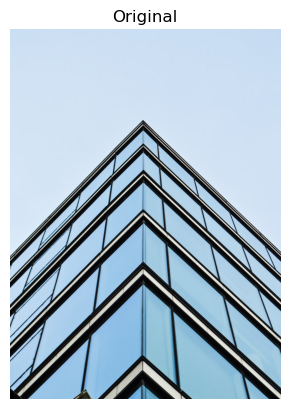

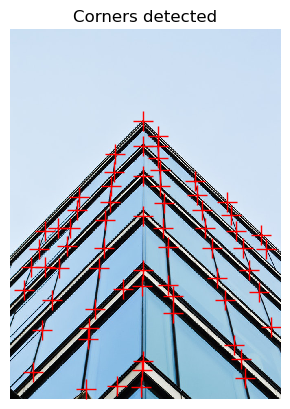

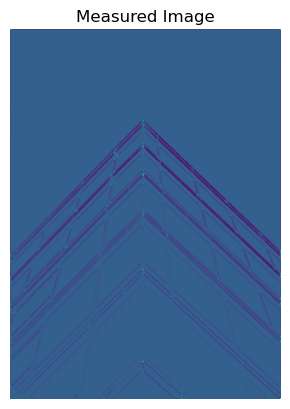

In [68]:
# Import the corner detector related functions and module
from skimage.feature import corner_harris, corner_peaks

# Convert image from RGB-3 to grayscale
building_image_gray = color.rgb2gray(building_image)

# Apply the detector  to measure the possible corners
measure_image = corner_harris(building_image_gray)

# Find the peaks of the corners using the Harris detector
coords = corner_peaks(corner_harris(building_image_gray), min_distance=20, threshold_rel=0.02)

# Show original and resulting image with corners detected
show_image(building_image, "Original")
show_image_with_corners(building_image, coords)
show_image(measure_image, 'Measured Image')

With a min_distance set to 10, we detect a total 89 corners in the image.
With a min_distance set to 60, we detect a total 20 corners in the image.


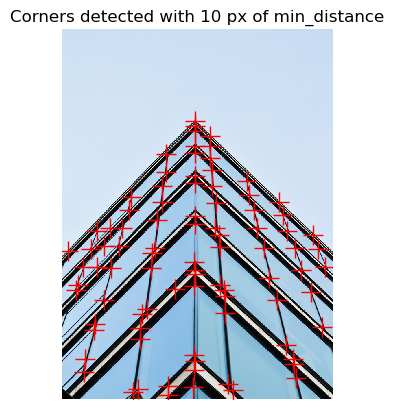

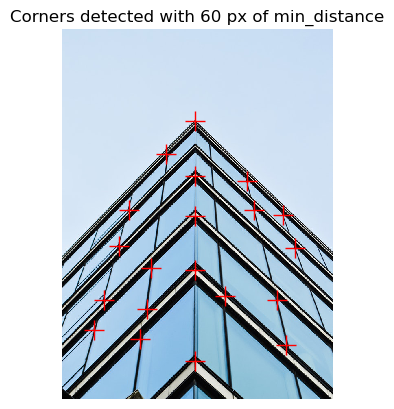

In [69]:
# Find the peaks with a min distance of 10 pixels
coords_w_min_10 = corner_peaks(measure_image, min_distance=10, threshold_rel=0.02)
print("With a min_distance set to 10, we detect a total", len(coords_w_min_10), "corners in the image.")

# Find the peaks with a min distance of 60 pixels
coords_w_min_60 = corner_peaks(measure_image, min_distance=60, threshold_rel=0.02)
print("With a min_distance set to 60, we detect a total", len(coords_w_min_60), "corners in the image.")

# Show original and resulting image with corners detected
show_image_with_corners(building_image, coords_w_min_10, "Corners detected with 10 px of min_distance")
show_image_with_corners(building_image, coords_w_min_60, "Corners detected with 60 px of min_distance")

###
### 4.3 Face Detection with scikit-image
- Perform face detection using scikit-image, is a key technique in computer vision with applications in social media, privacy protection, and emotion recognition
- Key Points:
    - Applications of Face Detection
        - Used in social media (filters, tagging, auto-blurring for privacy)
        - First step in emotion recognition (detecting happiness, sadness, etc.)
- How It Works?
    - Uses a pre-trained machine learning classifier (Cascade of Classifiers)
    - Can detect frontal faces (default) but can also be trained for other objects (e.g., cats, profile faces)
- Implementation Steps
    - Import Cascade from skimage.feature
    - Load a pre-trained model (XML file, included in scikit-image’s data module).
    - Initialize the detector with Cascade().
    - Detect faces using detect_multi_scale():
        - cales the search window to find faces of different sizes.
        - Parameters:
            - scale_factor: How much the window grows per step.
            - step_ratio: Trade-off between speed and accuracy (1 = slow but precise).
            - min/max_size: Defines the smallest/largest detectable faces.
- Output
    - Returns bounding box coordinates (row, column, width, height).
    - A helper function draws red rectangles around detected faces.

In [70]:
# SHOW DETECTED FACES FUNCTION

def show_detected_face(result, detected, title='Face image'):
    plt.imshow(result)
    img_desc = plt.gca()  # Corrected from gac() to gca()
    plt.set_cmap('gray')
    plt.title(title)
    for patch in detected:
        img_desc.add_patch(
            patches.Rectangle(
                (patch['c'], patch['r']),
                patch['width'],
                patch['height'],
                fill=False,
                color='r',
                linewidth=1)
        )
    plt.axis('off')
    plt.show()

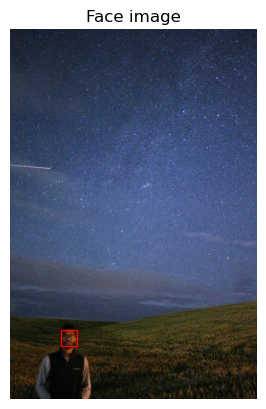

In [73]:
from skimage.feature import Cascade
from skimage import data, io
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle  # Import Rectangle explicitly
import matplotlib.patches as patches  # Add this import at the top

# Load the trained file from source

night_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 4\\face_det3.jpg")

trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect faces with min and max size of searching window
detected = detector.detect_multi_scale(img = night_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(5, 5),
                                       max_size=(200, 200))

# Show the detected faces
show_detected_face(night_image, detected)

Detected 1 faces:
Face 1: Row 62, Column 170, Size 109x109


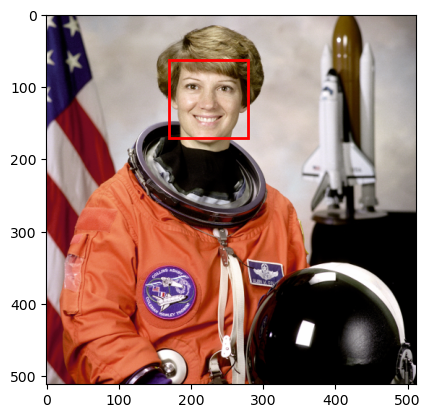

In [74]:
from skimage import data, feature, io, draw
import matplotlib.pyplot as plt

def show_image_with_boxes(image, faces):
    """Display image with detected faces marked"""
    fig, ax = plt.subplots()
    ax.imshow(image, cmap='gray')
    
    for face in faces:
        r, c, width, height = face['r'], face['c'], face['width'], face['height']
        rect = plt.Rectangle((c, r), width, height, 
                            fill=False, linewidth=2, color='red')
        ax.add_patch(rect)
    
    plt.show()

# 1. Load an image (or use your own with io.imread())
image = data.astronaut()

# 2. Load pre-trained classifier (frontal face by default)
trained_file = data.lbp_frontal_face_cascade_filename()

# 3. Initialize detector
detector = feature.Cascade(trained_file)

# 4. Detect faces with multi-scale approach
faces = detector.detect_multi_scale(img=image,
                                   scale_factor=1.2,
                                   step_ratio=1,
                                   min_size=(30, 30),
                                   max_size=(300, 300))

# 5. Display results
print(f"Detected {len(faces)} faces:")
for i, face in enumerate(faces):
    print(f"Face {i+1}: Row {face['r']}, Column {face['c']}, Size {face['width']}x{face['height']}")

show_image_with_boxes(image, faces)

Detected 7 faces:
Face 1: Row 202, Column 31, Size 36x36
Face 2: Row 207, Column 152, Size 47x47
Face 3: Row 217, Column 311, Size 39x39
Face 4: Row 242, Column 237, Size 41x41
Face 5: Row 202, Column 402, Size 45x45
Face 6: Row 219, Column 533, Size 48x48
Face 7: Row 218, Column 440, Size 52x52


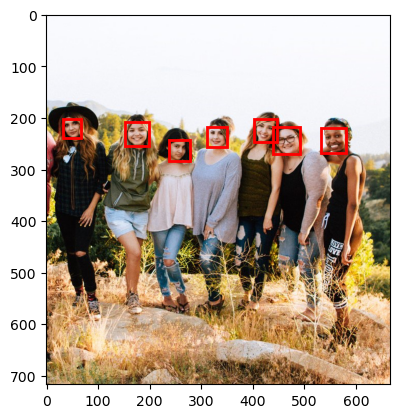

In [75]:
# Import necessary libraries
from skimage.feature import Cascade
from skimage import data, io
import matplotlib.pyplot as plt

# Load the image (corrected path syntax)
# Note: Use raw string (r prefix) or forward slashes for Windows paths
image = io.imread(r"C:\Users\abdul\Desktop\DataCamp\Image Processing\chapter 4\face_det_friends22.jpg")
# Alternatively: image = plt.imread(r"C:\Users\abdul\Desktop\DataCamp\Image Processing\chapter 4\face_det_friends22.jpg")

def show_image_with_boxes(image, faces):
    """Display image with detected faces marked"""
    fig, ax = plt.subplots()
    ax.imshow(image)  # Removed cmap='gray' to show color images properly
    
    for face in faces:
        r, c, width, height = face['r'], face['c'], face['width'], face['height']
        rect = plt.Rectangle((c, r), width, height, 
                            fill=False, linewidth=2, color='red')
        ax.add_patch(rect)
    
    plt.show()

# Load pre-trained classifier (frontal face by default)
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize detector
detector = Cascade(trained_file)

# Detect faces with multi-scale approach
faces = detector.detect_multi_scale(img=image,
                                   scale_factor=1.2,
                                   step_ratio=1,
                                   min_size=(10, 10),
                                   max_size=(100, 100))

# Display results
print(f"Detected {len(faces)} faces:")
for i, face in enumerate(faces):
    print(f"Face {i+1}: Row {face['r']}, Column {face['c']}, Size {face['width']}x{face['height']}")

# Show the image with detected faces
show_image_with_boxes(image, faces)

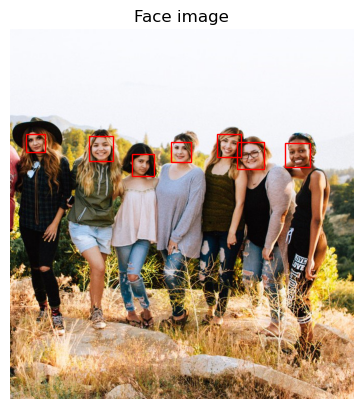

In [76]:
friends_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 4\\face_det_friends22.jpg")

# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = feature.Cascade(trained_file)

# Detect faces with scale factor to 1.2 and step ratio to 1
detected = detector.detect_multi_scale(img=friends_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
# Show the detected faces
show_detected_face(friends_image, detected)

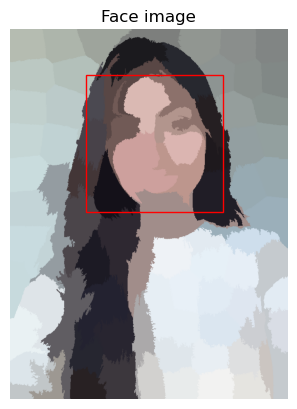

In [77]:
#Segmentation and face detection

profile_image=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 4\\face_det9.jpg")

# Obtain the segmentation with default 100 regions
segments = slic(profile_image)

# Obtain segmented image using label2rgb
segmented_image = label2rgb(segments, profile_image, kind='avg')

# Detect the faces with multi scale method
detected = detector.detect_multi_scale(img=segmented_image, 
                                       scale_factor=1.2, 
                                       step_ratio=1, 
                                       min_size=(10, 10), max_size=(1000, 1000))

# Show the detected faces
show_detected_face(segmented_image, detected)

###
### 4.4 Real-World Applications
Combines multiple image-processing techniques for practical use cases

Examples include grayscale conversion before edge detection, face detection followed by blurring, and image restoration
- Applications
    - Techniques can be chained:
    - Grayscale → Edge/Corner Detection
    - Face Detection → Gaussian Blur (Privacy Protection)
    - Noise Reduction → Image Restoration
- Privacy Protection Case Study
    - Step 1: Detect Faces
        - Uses a Cascade Classifier (pre-trained for frontal faces)
    - Step 2: Crop & Blur Faces
        - Extract face regions using coordinates (r, c, width, height)
        - Apply Gaussian Filter to anonymize faces
    - Step 3: Merge Back into Image
        - Replace original faces with blurred versions.
    - Limitation: Only detects frontal faces (profile faces require additional training data)
- Beyond Privacy Protection 
    - Many other applications exist (e.g., emotion recognition, social media filters).
    - Techniques from the course can be creatively combined for new solutions.

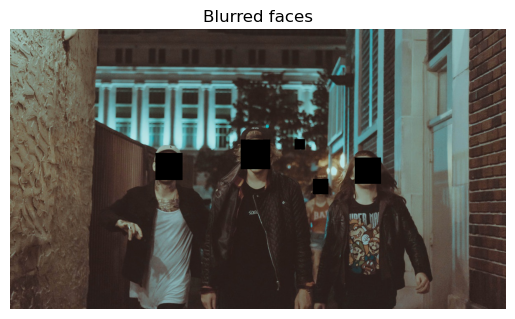

In [78]:
from skimage.feature import Cascade
from skimage import data, io, filters
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Load the image
group_image = plt.imread(r"C:\Users\abdul\Desktop\DataCamp\Image Processing\chapter 4\face_det25.jpg")

# Define helper functions
def getFaceRectangle(image, face_coords):
    """Extract face region from image using detection coordinates"""
    r, c, width, height = face_coords['r'], face_coords['c'], face_coords['width'], face_coords['height']
    return image[r:r+height, c:c+width]

def mergeBlurryFace(original_image, blurred_face, face_coords):
    """Merge blurred face back into original image"""
    r, c = face_coords['r'], face_coords['c']
    original_image[r:r+blurred_face.shape[0], c:c+blurred_face.shape[1]] = blurred_face
    return original_image

def show_image(image, title=""):
    """Display image with title"""
    plt.imshow(image)
    plt.title(title)
    plt.axis('off')
    plt.show()

# Load pre-trained classifier
trained_file = data.lbp_frontal_face_cascade_filename()
detector = Cascade(trained_file)

# Detect faces
detected = detector.detect_multi_scale(img=group_image, 
                                     scale_factor=1.2, 
                                     step_ratio=1, 
                                     min_size=(10,10), 
                                     max_size=(100, 100))

# Process each detected face
resulting_image = group_image.copy()  # Work on a copy to preserve original
for d in detected:
    # Extract face region
    face = getFaceRectangle(resulting_image, d)
    
    # Apply gaussian blur
    blurred_face = filters.gaussian(face, sigma=8, channel_axis=-1)  # Updated for newer skimage
    
    # Merge back into image
    resulting_image = mergeBlurryFace(resulting_image, blurred_face, d)

# Show final result
show_image(resulting_image, "Blurred faces")

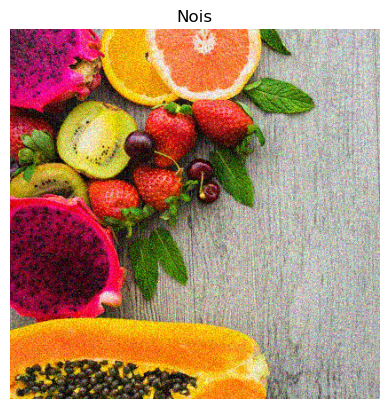

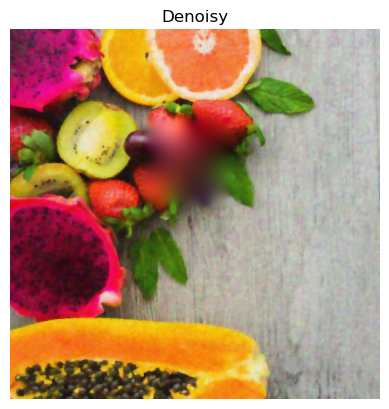

In [79]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import denoise_tv_chambolle, inpaint
from skimage.transform import rotate

# Load the damaged image
noisy_fruit_image

# Rotate the image (360° means no change)
upright_img = rotate(noisy_fruit_image, 360)

# Denoise the image (Chambolle method)
upright_img_without_noise = denoise_tv_chambolle(upright_img, weight=0.1, channel_axis=-1)

# Create a mask (2D array: True = damaged regions)
mask = np.zeros(upright_img.shape[:2], dtype=bool)  # Shape = (height, width)

# Example: Mark a region as damaged (adjust coordinates as needed)
mask[100:200, 150:250] = True  # Example: Rectangle damage area

# Reconstruct missing parts (use channel_axis=-1 for RGB images)
result = inpaint.inpaint_biharmonic(upright_img_without_noise, mask, channel_axis=-1)

# Display the result
show_image(noisy_fruit_image, 'Nois')
show_image(result, 'Denoisy')
plt.show()

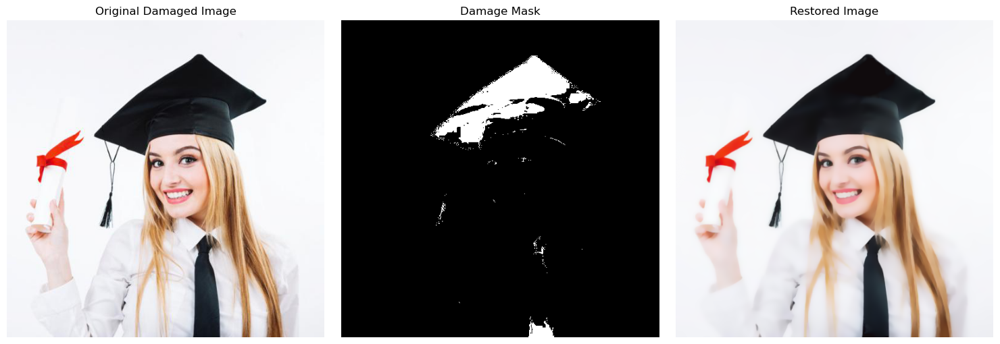

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import denoise_tv_chambolle, inpaint
from skimage.transform import rotate
from skimage import color

# Load the damaged image
damaged_image = plt.imread(r"C:\Users\abdul\Desktop\DataCamp\Image Processing\chapter 4\sally2.jpg")

# Define the get_mask function (customize based on your image damage)
def get_mask(image):
    """
    Create a mask indicating damaged areas.
    This example assumes damaged areas are black (0,0,0) or nearly black.
    Adjust the threshold according to your image.
    """
    if len(image.shape) == 3:  # Color image
        # Convert to grayscale for mask creation
        gray_img = color.rgb2gray(image)
        # Create mask where pixel values are below threshold (damaged areas)
        mask = gray_img < 0.1  # Adjust threshold (0.1 = 10% of max brightness)
    else:  # Grayscale image
        mask = image < 0.1
    return mask

# Step 1: Rotate if needed (change angle as required)
# upright_img = rotate(damaged_image, angle=30)  # Uncomment and adjust angle if needed
upright_img = damaged_image.copy()  # Using original if no rotation needed

# Step 2: Denoise the image
upright_img_without_noise = denoise_tv_chambolle(
    upright_img, 
    weight=0.1, 
    channel_axis=-1 if upright_img.ndim == 3 else None
)

# Step 3: Create mask of damaged areas
mask = get_mask(upright_img)

# Step 4: Reconstruct missing parts
result = inpaint.inpaint_biharmonic(
    upright_img_without_noise, 
    mask, 
    channel_axis=-1 if upright_img.ndim == 3 else None
)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(damaged_image)
axes[0].set_title("Original Damaged Image")
axes[0].axis('off')

axes[1].imshow(mask, cmap='gray')
axes[1].set_title("Damage Mask")
axes[1].axis('off')

axes[2].imshow(result)
axes[2].set_title("Restored Image")
axes[2].axis('off')

plt.tight_layout()
plt.show()